<div class="alert alert-success">
<h1> Комментарий ревьюера</h1>

Привет, Евгений!
    
Меня зовут Николай Акопджанов, и я буду проверять твой проект) Предлагаю нам сразу перейти на ты, если ты не против)
    
Стоит сразу заметить, что основная моя задача помочь тебе в освоении пройденного материала, а не в оценке проекта. 
    
Мои комментарии обозначены пометкой **Комментарий ревьюера**. Далее в файле ты сможешь найти их в похожих ячейках (если фон комментария <font color=green>зелёный</font> и есть такой 👍 знак  - всё сделано правильно; <font color=orange>оранжевый</font> и есть такой 💡 знак - есть что улучшить, но не критично; <font color=red>красный</font> и есть такой ❌ знак- нужно переделать). Не удаляй эти комментарии и постарайся учесть их в ходе выполнения данного проекта. 
    
Ты можешь отвечать мне своими комментариями и выделять их другим <font color=blue>цветом</font>.

</div>

<div class="alert alert-success">
<h1> Комментарий ревьюера</h1>

Еще раз привет!
    
Спасибо за доработку проекта.
Новые комментарии будут отмечены V2
</div>

# Описание проекта

<div style="border: 1px solid; padding: 20px">
<i>Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
<br>Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
<br>Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.</i>

![gif](https://i.gifer.com/3ena.gif)

</div>

# Описание данных

**Файл** `moscow_places.csv`:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽».
   <br>и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Оригинальная вводная часть всегда приветствуется)
</div>

## Часть 1: Изучение и предобработка данных

### Изучаем данные

In [1]:
import os
import re
import math
import pandas as pd
import numpy as np
!pip install folium -U
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
!pip install geojson -U
import geojson
!pip install urllib3 -U
import urllib.request
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
pth = 'moscow_places.csv'

if os.path.exists(pth):
    data = pd.read_csv(pth)
else:
    try:
        data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
    except:
        print('Что-то пошло не так...')        
        
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
# посмотрим общую информацию о данных
data.info()
print('\n')
print('Всего в таблице представлено {} заведений.'.format(data.shape[0]))
print('Из них {} заведений относятся к сетевым.'.format(data[data['chain'] == 1]['name'].count()))
print('В таблице представлено {} уникальных наименований заведений.'.format(data['name'].nunique()))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в таблице представлено 8406 заведений.
Из них 3205 за

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Отлично, данные подгрузились верно)
</div>

### Подготавливаем данные к анализу

In [4]:
# посмотрим на количество явных дубликатов
data.duplicated().sum()

0

In [5]:
# приведем названия заведений к нижнему регистру, заменим "ё" на "е", "й" на "и","." на " " посчитаем количество уникальных названий
if data['name'].str.lower().str.replace('ё','е').str.replace('й','и').str.replace('.',' ',regex=False).nunique() < data['name'].nunique():
    print('Приведя столбец name к нижнему регистру, количество уникальных наименований заведений стало {}.'
          .format(data['name'].str.lower().str.replace('ё','е').str.replace('й','и').str.replace('.',' ',regex=False).nunique()))
    data['name'] = data['name'].str.lower().str.replace('ё','е').str.replace('й','и').str.replace('.',' ',regex=False)

Приведя столбец name к нижнему регистру, количество уникальных наименований заведений стало 5505.


Избавились от 109-и неявных дубликатов в названиях заведений.

In [6]:
display(data['name'].value_counts())
display(data.query('name == "кафе"').head(5))

кафе              189
шоколадница       120
домино'с пицца     77
додо пицца         74
яндекс лавка       72
                 ... 
shaverma house      1
beersenev bar       1
kuzu kebab          1
фермербуфет         1
у бурчо             1
Name: name, Length: 5505, dtype: int64

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
40,кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
47,кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0
108,кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
123,кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0
141,кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,0,70.0


В данных присутствует 189 заведений со странным названием "кафе", при это даже не все такие заведения относятся к категории кафе.

In [7]:
# проверим и другие "странные" названия
for i in ["бар", "паб", "бар,паб", "булочная", "быстрое питание", "заправка", "кофейня", "пиццерия", "ресторан", "столовая",
          "хинкальная", "шаурма", "чаихана", "раменная"]:
    print('Заведений с названием', i+': {}'. format(data.query('name == @i')['name'].count()))

Заведений с названием бар: 0
Заведений с названием паб: 1
Заведений с названием бар,паб: 0
Заведений с названием булочная: 1
Заведений с названием быстрое питание: 3
Заведений с названием заправка: 1
Заведений с названием кофейня: 0
Заведений с названием пиццерия: 3
Заведений с названием ресторан: 34
Заведений с названием столовая: 28
Заведений с названием хинкальная: 44
Заведений с названием шаурма: 43
Заведений с названием чаихана: 37
Заведений с названием раменная: 0


Запомним, что у нас присутствуют заведения со "странными" названиями. Сейчас не будем фильтровать данные, но в дальнейшем, когда потребуется анализировать популярные сети, записи с такими названиями придется отбросить.

<div class="alert alert-warning">
<h1> Комментарий ревьюера 💡</h1>
    
В целом, доля таких заведений небольшая, поэтому можем от них избавиться)</div>

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Чуть больше 4%. Предпочту оставить, дальше просто фильтрую там, где это требуется.
</div>

In [8]:
# проверим category на неявные дубликаты, отсортируем в алфавитном порядке
np.sort(data.category.unique())

array(['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня',
       'пиццерия', 'ресторан', 'столовая'], dtype=object)

In [9]:
# проверим адреса на наличие неявных дубликатов
print('В таблице представлено {} уникальных адреса.'.format(data['address'].nunique()))
print('Приведя столбец к нижнему регистру, количество уникальных адресов стало {}.'
      .format(data['address'].str.lower().str.replace('ё','е').str.replace('й','и').nunique()))

В таблице представлено 5753 уникальных адреса.
Приведя столбец к нижнему регистру, количество уникальных адресов стало 5752.


Так как дальше мы будем анализировать только названия улиц, а не полные адреса, то проверим неявные дубликаты для улиц позже, а пока оставим как есть.

In [10]:
# проверим округа на наличие неявных дубликатов
print('В таблице представлено {} уникальных округов.'.format(data['district'].nunique()))
print('Приведя столбец к нижнему регистру, количество уникальных округов стало {}.'
      .format(data['district'].str.lower().str.replace('ё','е').str.replace('й','и').nunique()))

В таблице представлено 9 уникальных округов.
Приведя столбец к нижнему регистру, количество уникальных округов стало 9.


<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Молодец, с неявными дубликатами разобрались)
</div>

In [11]:
# посмотрим на количество пропусков в данных
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В данных очень много пропусков. Причина возникновения пропусков в столбцах 'middle_avg_bill' и 'middle_coffee_cup' понятна исходя из описания данных, но вот причина появления остальных не ясна. Предположительно, в базе не представлены соответствующие данные или во вроемя выгрузки произошла ошибка. Для заполения пропусков у нас недостаточно информации, на данный момент придется их оставить.

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Правильное решение - лучше их оставить
</div>

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

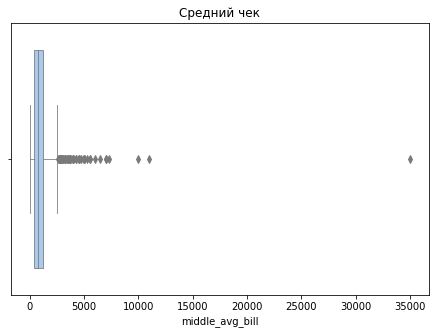

In [12]:
# посмотрим внимательнее на данные в столбце 'middle_avg_bill'
display(data['middle_avg_bill'].describe())
mean_avg_bill = data['middle_avg_bill'].describe()[1]

plt.figure(figsize=(7.5, 5))
sns.boxplot(x=data['middle_avg_bill'], palette='pastel', linewidth=.8).set_title("Средний чек");

Максимальный чек в 35 тыс. руб., для ресторана это в целом возможно, но минимальное значение среднего чека в 0 руб.🤔? Посмотрим подробнее на данные.

In [13]:
# посмотрим на максимум, минимум, среднее и медиану для различных категорий среднего чека
data[data['middle_avg_bill'].isnull() == False][['price', 'middle_avg_bill', 'category']]\
    .groupby(['price', 'category'])['middle_avg_bill'].agg(['max', 'min', 'mean', 'median'])

max     min         mean  median
price         category                                             
высокие       бар,паб          11000.0  1750.0  2285.555556  2000.0
              булочная          2500.0  1750.0  2250.000000  2500.0
              быстрое питание   5500.0  2750.0  3816.666667  3200.0
              кафе              4500.0   950.0  2133.333333  2000.0
              кофейня           2500.0     0.0  1814.705882  2000.0
              пиццерия          3000.0  1650.0  2077.241379  1900.0
              ресторан         35000.0  1000.0  2646.183206  2250.0
              столовая          3750.0  3750.0  3750.000000  3750.0
выше среднего бар,паб           4500.0   375.0  1354.009901  1250.0
              булочная          1250.0   500.0  1050.000000  1225.0
              быстрое питание   1500.0  1200.0  1300.000000  1250.0
              кафе              1700.0  1100.0  1302.739726  1250.0
              кофейня           2000.0   700.0  1310.000000  1250.0
              пиццерия          2000.0  1000.0  1348.571429  1250.0
              ресторан          2250.0   750.0  1359.325397  1250.0
              столовая          1250.0  1200.0  1225.000000  1225.0
низкие        бар,паб            190.0   150.0   170.000000   170.0
              булочная           200.0   150.0   166.666667   150.0
              быстрое питание    225.0    90.0   156.857143   150.0
              кафе               600.0   100.0   207.692308   150.0
              кофейня            325.0   120.0   173.250000   145.5
              пиццерия           300.0   150.0   225.000000   225.0
              ресторан           575.0   120.0   324.761905   300.0
              столовая           265.0   125.0   202.000000   212.5
средние       бар,паб           1250.0   165.0   794.958042   850.0
              булочная          1000.0   200.0   498.571429   442.5
              быстрое питание   1100.0   200.0   429.953642   400.0
              кафе              1750.0   200.0   585.574786   500.0
              кофейня           1100.0   200.0   484.340741   400.0
              пиццерия          1250.0   199.0   679.200000   670.0
              ресторан          2150.0   200.0   709.348449   700.0
              столовая          1000.0   195.0   317.359712   300.0

Градации 'price' практически во всех категориях соответствуют данным 'middle_avg_bill', необходимо только исправить минимальную цену для среднего чека в 0 руб. Еще стоит отбросить ресторан с ценником в 35 тыс. руб., уж очень сильно он выбивается из представленных данных.

In [14]:
data = data.query('middle_avg_bill != 35000.0')

In [15]:
# заменим нулевое значением среднего чека на среднее для этой сети
display(data.query('middle_avg_bill == 0.0'))
print('Среднее для middle_avg_bill в сети "Кофемания": {} руб.'
      .format(data.query('name == "кофемания"')['middle_avg_bill'].mean()))
bill_check = round(data.query('name == "кофемания"')['middle_avg_bill'].mean(), 0)

data.loc[data.index == data.query('middle_avg_bill == 0.0').index[0], 'avg_bill'] = 'Средний счёт:1809 ₽'
data.loc[data.index == data.query('middle_avg_bill == 0.0').index[0], 'middle_avg_bill'] = bill_check

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3688,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0


Среднее для middle_avg_bill в сети "Кофемания": 1809.375 руб.


count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

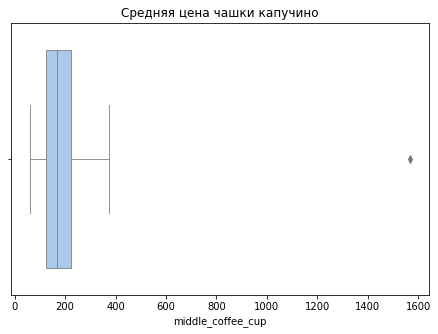

In [16]:
# посмотрим внимательнее на данные в столбце 'middle_coffee_cup'
display(data['middle_coffee_cup'].describe())
mean_coffee_value = data['middle_coffee_cup'].describe()[1]

plt.figure(figsize=(7.5, 5))
sns.boxplot(x=data['middle_coffee_cup'], palette='pastel', linewidth=.8).set_title("Средняя цена чашки капучино");

Максимальное значение для средней цены чашки капучино 1568 рублей!😱 Похоже, мы столкнулись с <s>очепаткой</s> опечаткой, ее стоит исправить.

In [17]:
display(data.query('middle_coffee_cup == 1568.0'))

# исправим ссылаясь на индекс строки
data.loc[data.index == data.query('middle_coffee_cup == 1568.0').index[0], 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
data.loc[data.index == data.query('middle_coffee_cup == 1568.0').index[0], 'middle_coffee_cup'] = 260.0

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


In [18]:
data.query('name == "шоколадница"')['middle_coffee_cup'].value_counts()

256.0    43
260.0     4
266.0     3
291.0     3
220.0     2
214.0     1
325.0     1
250.0     1
227.0     1
170.0     1
287.0     1
246.0     1
Name: middle_coffee_cup, dtype: int64

Теперь для сети "Шоколадница" все в рамках разумного.

In [19]:
print(data[data['middle_coffee_cup'].isnull() == False][['price', 'middle_coffee_cup']]\
            .groupby('price')['middle_coffee_cup'].mean()
            .to_string(name=False, dtype=False))

price
высокие          250.000000
выше среднего    203.000000
низкие           136.614035
средние          203.403670


Проблема осталась, в данные определенно закралась ошибка, так как "средняя" цена отмечена как ~203 (хотя, согласно описательным статистикам для столбца, должна быть около 170), а цена "выше среднего" тоже 203. Если внимательно ознакомиться с данными, то можно легко заметить, что заведения с ценой за чашку капучино в 300 руб. и больше почему-то попадают в раздел "средние".

In [20]:
# напишем функцию, которая исправит градации цен основываясь на 'middle_coffee_cup'
# в качесте примерной "средней" цены за чашку капучино возьмем mean_coffee_value
# значения "выше среднего" и "высокие" определим исходя из таблички выше

high_coffee_value = 203
v_high_coffee_value = 250

def fix_coffee_price(row):
    if row['price'] != row['price']:
        return(row['price'])
    else:
        if math.isnan(row['middle_coffee_cup']) != True:
            if row['middle_coffee_cup'] < mean_coffee_value:
                return('низкие')
            elif v_high_coffee_value > row['middle_coffee_cup'] >= high_coffee_value:
                return('выше среднего')
            elif row['middle_coffee_cup'] >= v_high_coffee_value:
                return('высокие')
            else:
                return('средние')
        else:
            return(row['price'])

data['price'] = data.apply(fix_coffee_price, axis=1)

In [21]:
# посмотрим на максимум, минимум, среднее и медиану для исправленных категорий middle_coffee_cup
data[data['middle_coffee_cup'].isnull() == False][['price', 'middle_coffee_cup']]\
    .groupby('price')['middle_coffee_cup']\
    .agg(['max', 'min', 'mean', 'median'])

,max,min,mean,median
price,,,,
высокие,328.0,250.0,267.492754,256.0
выше среднего,246.0,204.0,223.707317,225.0
низкие,174.0,60.0,135.000000,139.5
средние,200.0,175.0,188.826087,189.5


Теперь наше разделение на ценовые сегменты больше приближено к реально наблюдаемым в данных. Кстати, такой подход позволил нам заполнить часть пропусков, где в столбце 'price' для заведений не было указано значение, но имелось число в 'middle_coffee_cup'.

<div class="alert alert-danger">
<h1> Комментарий ревьюера ❌</h1>
    
Пропуски лучше оставить нетронутыми, чтобы они не повлияли на результат исследования.</div>

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Исправил, теперь во время работы функция сначала проверяет столбец 'price', если там стоит NaN, она такую строку пропускает. Пропуски больше не заполняются, а только исправляются уже заполненные категории.
</div>

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍 V2</h1>

Отлично!
</div>

In [22]:
# посмотрим как обстоят дела с колонкой 'chain'
chain_data = data.query('chain == 1').reset_index()
display(chain_data.groupby('name')['address'].count().sort_values())

# отберем сети, в которых всего одна точка (сначала названия, а потом перезапишем индексы)
chain_1_list = chain_data.groupby('name')['address'].count()[chain_data.groupby('name')['address'].count() == 1].index.tolist()

name
1-я креветочная       1
суши wok              1
суши таун             1
суши-пицца 312        1
баку                  1
                   ... 
one price coffee     71
яндекс лавка         72
додо пицца           74
домино'с пицца       76
шоколадница         120
Name: address, Length: 745, dtype: int64

Видим, что среди "сетевых" заведений есть такие, которые насчитывают только одну точку, эти заведения по определению не должны относиться к сетевым. Однако, очевидно, что "Суши Wok", например, относится с крупной международной сети, у них явно больше одной точки в Моксве. Описание данных предупреждает, что для маленьких сетей могут встречаться ошибки, но, кажется, есть проблемы не только с маленькими сетями. В любом случае, адекватно оценить правильность заполнения данных в колонке 'chain' не представляется возможным.

count    4794.000000
mean      108.423446
std       122.846149
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

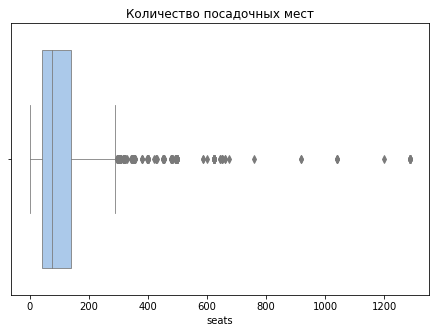

In [23]:
# посмотрим внимательнее на данные в столбце 'seats'
display(data.seats.describe())

plt.figure(figsize=(7.5, 5))
sns.boxplot(x=data['seats'], palette='pastel', linewidth=.8).set_title("Количество посадочных мест");

Минимальное значение в 0 посадочных мест возможно, ведь существуют небольшие заведения, в которых можно брать еду только навынос. Заведения с числом посадочных мест более 300 также имеют право на существование, учитывая, что у нас в данных представлены, помимо прочего, рестораны и столовые, которые, потенцально, способны вместить большое количество посетителей. По крайней мере, мы не можем на 100% утверждать, что данные ошибочные, так что удалять и фильтровать ничего не будем.

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Молодец, ты очень скурпулезно реализовал предобработку. Есть одно небольшое замечание.
</div>

### Добавляем новые столбцы

Необходимо вычленить названия улиц из адресов заведения, это не самая тривиальная задача...
***
*Обработка адресов при помощи ML для оптимизации поисковых запросов - одна из многих задач решаемых с помощью NLP, в частности, с помощью NER (Named Entity Recognition).* 
***
Изначально была предпринята попытка использовать тут библиотеку natasha:
- https://newtechaudit.ru/obrabotka-nl-adresov-dlya-sozdaniya-effektivnyh-poiskovyh-zaprosov/
- https://github.com/natasha/natasha

Однако, результат получился достаточно скверным, адреса в которых присутствовали названия парков, заказников и прочего не вычлинялись совсем. В качестве второй попытки использовалась функция из  статьи:
- https://habr.com/ru/post/573018/

К сожалению, и тут тоже не получилось нормально отобрать названия улиц. По итогу, самым оптимальным, с точки зрения итогового результата, оказалось использование заранее готового списка с названиями и сокращениями как в примере:
- https://ru.stackoverflow.com/questions/1146249/%D0%92%D1%8B%D0%B4%D0%B5%D0%BB%D0%B8%D1%82%D1%8C-%D1%87%D0%B0%D1%81%D1%82%D1%8C-%D1%81%D1%82%D1%80%D0%BE%D0%BA%D0%B8-%D0%BF%D0%BE-%D0%BA%D0%BB%D1%8E%D1%87%D0%B5%D0%B2%D1%8B%D0%BC-%D1%81%D0%BB%D0%BE%D0%B2%D0%B0%D0%BC

In [24]:
to_replace = {r'Москва, МКАД,': r'Москва, МКАД'}
data['address'] = data['address'].replace(to_replace, regex=True)

list = ["ал\.","аллея","б-р","бульвар","взв\.","взд\.","въезд","дор\.","дорога","ззд\.","заезд","километр",
 "к-цо","кольцо","лн\.","линия","мгстр\.","магистраль","МКАД", "наб\.","набережная","парк","пер-д","переезд","пер\.",
 "переулок","пл-ка","площадка","пл\.","площадь","пр-кт\.","проезд","проспект","проул\.","проулок","рзд\.","разъезд",
 "ряд","с-р","сквер","с-к","спуск","сзд\.","съезд","тракт","туп\.","тупик","ул\.","улица","ш\.","шоссе"]
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(list))

# cоздайте столбец 'street' с названиями улиц
data['street'] = data['address'].str.extract(str_pat, flags=re.I)

to_replace_back = {r'Москва, МКАД': r'Москва, МКАД,'}
data['address'] = data['address'].replace(to_replace_back, regex=True)

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Хорошее и нетривиальное решение)
</div>

In [25]:
# проверим улицы на наличие неявных дубликатов
print('В таблице представлено {} уникальных улиц.'.format(data['street'].nunique()))
print('Приведя столбец к нижнему регистру, количество уникальных улиц стало {}.'
      .format(data['street'].str.lower().str.replace('ё','е').str.replace('й','и').nunique()))

В таблице представлено 1397 уникальных улиц.
Приведя столбец к нижнему регистру, количество уникальных улиц стало 1397.


In [26]:
# cоздайте столбец 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно 
def is_24_7(row):
    if row['hours'] == "ежедневно, круглосуточно":
        return True
    else:
        return False
    
data['is_24/7'] = data.apply(is_24_7, axis=1)

<div style="border-radius: 15px; background:BlanchedAlmond; padding: 20px">

📜 Итог после изучения общей информации и подготовки данных:
- в данных присутствует большое количество пропусков, которые без привлечения допонительных источников не представляется возможным заполнить
- исправлено 109 неявных дубликатов в названиях заведений общественного питания
- обнаружены "странные" названия заведений (Кафе, Шаурма, Чайхана и тд.), такие название будет необходимо отфильтровать в ходе дельнейшей работы, чтобы они не искажали анализ
- устранен один выброс в столбце 'middle_avg_bill'
- градации параметра 'price' приведены в соответствие ценовым диапазонам 'middle_coffee_cup' где это возможно
- обнаружены ошибки заполнения данных  в столбце 'chain', но достоверно исправить их не представляется возможным
- добавлены столбцы 'street' (содержит названия улиц) и 'is_24/7' (значения True/False указывают работает ли заведение ежедневно и круглосуточно)

</div>

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Молодец, что креативно подошел к процессу оформления общего вывода первой части
</div>

## Часть 2. Анализ данных

In [27]:
# посмотрим, присутствуют ли корреляции между различными анализируемыми параметрами в наших данных
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm')

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
lat,1.000000,-0.129418,0.028299,0.011342,-0.016574,-0.017357,-0.022545,-0.013453
lng,-0.129418,1.000000,-0.017097,-0.072180,-0.096974,-0.046874,-0.088822,0.033560
rating,0.028299,-0.017097,1.000000,0.237712,0.149466,-0.014980,0.021021,-0.103274
middle_avg_bill,0.011342,-0.072180,0.237712,1.000000,nan,-0.149794,0.115256,-0.084049
middle_coffee_cup,-0.016574,-0.096974,0.149466,nan,1.000000,-0.076940,-0.007543,0.138833
chain,-0.017357,-0.046874,-0.014980,-0.149794,-0.076940,1.000000,0.041965,0.030477
seats,-0.022545,-0.088822,0.021021,0.115256,-0.007543,0.041965,1.000000,-0.045230
is_24/7,-0.013453,0.033560,-0.103274,-0.084049,0.138833,0.030477,-0.045230,1.000000


Практически все коэффициенты корреляции находятся в диапазон от -0.1 до 0.1, что говорит об отсутствии прямой зависимости между анализируемыми параметрами.

In [28]:
def pie_and_distribution(col_names, palett):
    colors = palett
    for i in col_names:
        print('В столбце', i, 'представлены следующие группы (не учитывая NaN):\n{}'
              .format(data[i].value_counts().to_string(name=False, dtype=False)))
        
        plt.figure(figsize=(7.5, 5))
        plt.pie(data[i].value_counts(), 
                labels=data[data[i].isnull() == False][i].unique(), 
                colors = colors, autopct='%.0f%%')
        plt.show();

В столбце category представлены следующие группы (не учитывая NaN):
кафе               2378
ресторан           2042
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256


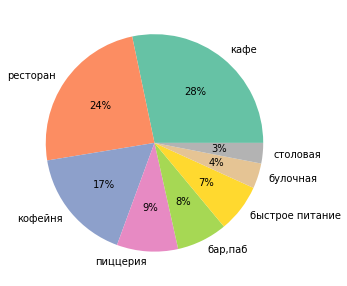

In [29]:
# посмотрим подробнее на распределение данных в столбце 'category'
pie_and_distribution(['category'], sns.color_palette('Set2'))

В представленных данных больше всего заведений относятся к категории кафе (28%), следом идут рестораны (24%) и кофейни (17%); оставшиеся типы заведений составляют в сумме 31% от общего числа заведений общественного питания.

In [30]:
data.groupby('category')['seats'].agg('mean').reset_index()

,category,seats
0,"бар,паб",124.532051
1,булочная,89.385135
2,быстрое питание,98.891117
3,кафе,97.512315
4,кофейня,111.199734
5,пиццерия,94.496487
6,ресторан,121.961387
7,столовая,99.750000


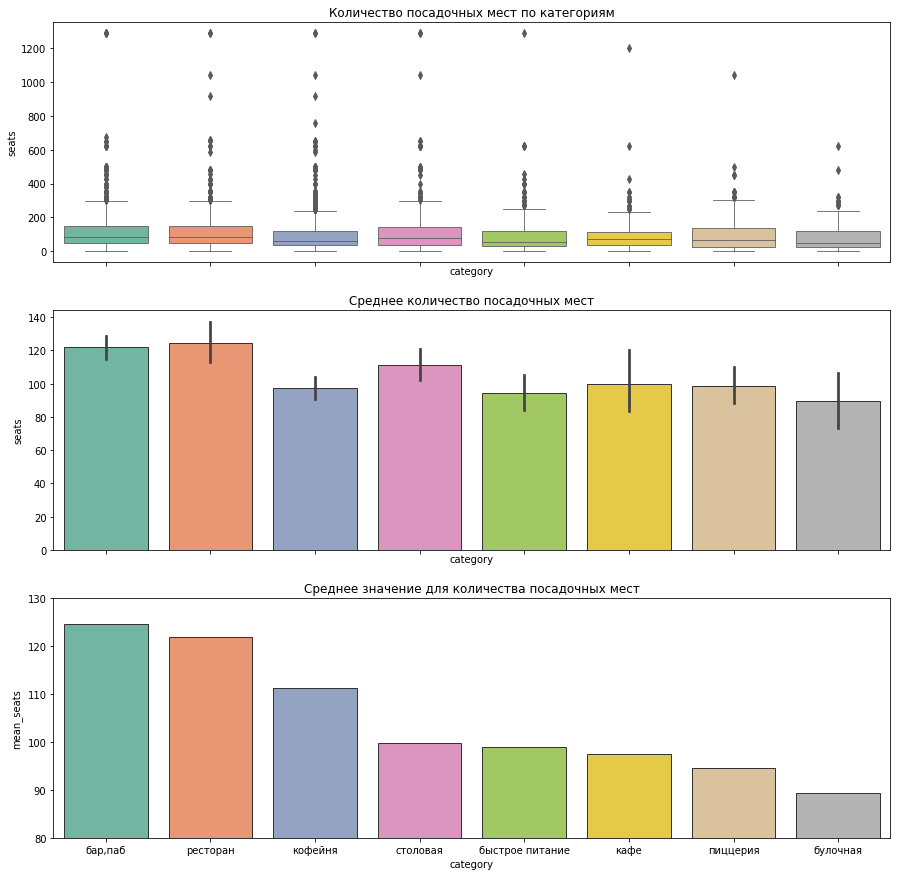

In [31]:
# исследуем количество посадочных мест в заведениях по категориям
f, axes = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

sns.boxplot(data=data.sort_values(by='seats', ascending=False),
            x='category',
            y='seats',
            palette='Set2', linewidth=.8, ax=axes[0])\
        .set_title("Количество посадочных мест по категориям")
sns.barplot(data=data.sort_values(by='seats', ascending=False),
            x='category',
            y='seats',
            palette='Set2', edgecolor='.2', ax=axes[1])\
        .set_title("Среднее количество посадочных мест")
ax=sns.barplot(data=data.groupby('category')['seats'].agg('mean').reset_index().sort_values(by='seats', ascending=False),
            x='category',
            y='seats',
            palette='Set2', edgecolor='.2', ax=axes[2])
ax.set(ylim=(80, 130), ylabel="mean_seats", title="Среднее значение для количества посадочных мест");

<div class="alert alert-danger">
<h1> Комментарий ревьюера ❌</h1>
    
Давай отсортируем данные в визуализациях. Так их будет легче интерпритировать</div>

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Исправил, теперь данные предварительно отсортированы. Дополнительно добавил третий график, который показывает конкретно среднее значение для количества посадочных мест по категориям.
</div>

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍 V2</h1>

Супер)
</div>

Наибольшее количество посадочных мест в среднем приходится на бары/пабы или рестораны - примерно 120 посадочных мест на заведение. В свою очередь, наименьшее среднее количество посадочных мест у булочных - около 90 на заведение.

In [32]:
# для упрощения восприятия визуализации заменим 0 и 1 в 'chain' да "нет" и "да", соответственно
def chain_binary(row):
    if row['chain'] == 1:
        return('да')
    else:
        return('нет')
    
data['chain'] = data.apply(chain_binary, axis=1)

В столбце chain представлены следующие группы (не учитывая NaN):
нет    5200
да     3205


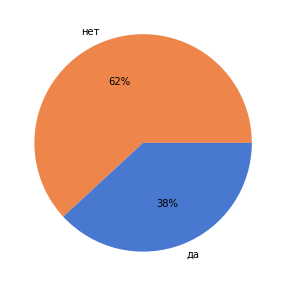

In [33]:
# посмотрим подробнее на распределение данных в столбце 'chain'
pie_and_distribution(['chain'], ['#ee854a','#4878d0']) 

Большинство заведений в представленных данных (62%) не относятся ни к одной из сетей. К сожалению, как уже было отмечено выше, в разбивке по параметру 'chain' присутствуют ошибки, что искажает реальную картину.

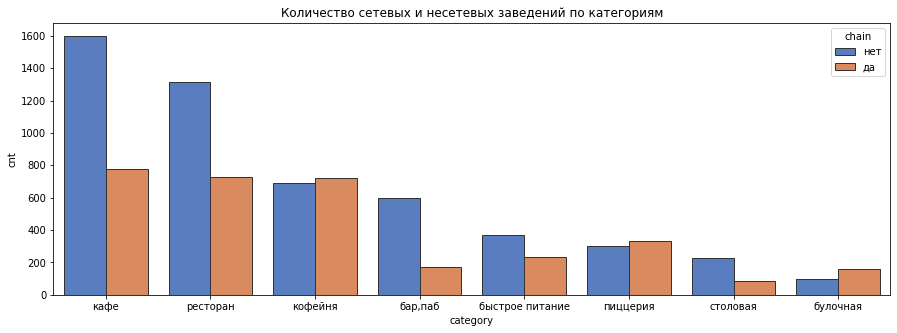

In [34]:
# исследуем, какие категории заведений чаще являются сетевыми
chain_per_category = data.groupby(['category', 'chain'])['chain']\
                         .count()\
                         .to_frame()\
                         .rename(columns={'chain':'cnt'})\
                         .reset_index().sort_values(by='cnt',ascending=False)

plt.figure(figsize=(15,5))
sns.barplot(x=chain_per_category['category'],
            y=chain_per_category['cnt'],
            hue=chain_per_category['chain'],
            palette='muted', edgecolor='.2')\
    .set_title("Количество сетевых и несетевых заведений по категориям");

<div class="alert alert-danger">
<h1> Комментарий ревьюера ❌</h1>
    
Тут тоже необходимо отсортировать данные</div>

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Добавил сортировку.
</div>

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍 V2</h1>

👍
</div>

In [35]:
if chain_per_category['chain'][0] == "да":
    i=0
    while i < len(chain_per_category):
        print('Доля сетевых заведений категории', chain_per_category['category'][i], 'от общего числа заведений такого типа: {:0.2%}'
              .format(chain_per_category['cnt'][i]/(chain_per_category['cnt'][i]+chain_per_category['cnt'][i+1])))
        i+=2
else:
    i=1
    while i < len(chain_per_category):
        print('Доля сетевых заведений категории', chain_per_category['category'][i], 'от общего числа заведений такого типа: {:0.2%}'
              .format(chain_per_category['cnt'][i]/(chain_per_category['cnt'][i]+chain_per_category['cnt'][i-1])))
        i+=2

Доля сетевых заведений категории бар,паб от общего числа заведений такого типа: 22.09%
Доля сетевых заведений категории булочная от общего числа заведений такого типа: 61.33%
Доля сетевых заведений категории быстрое питание от общего числа заведений такого типа: 38.47%
Доля сетевых заведений категории кафе от общего числа заведений такого типа: 32.76%
Доля сетевых заведений категории кофейня от общего числа заведений такого типа: 50.96%
Доля сетевых заведений категории пиццерия от общего числа заведений такого типа: 52.13%
Доля сетевых заведений категории ресторан от общего числа заведений такого типа: 35.75%
Доля сетевых заведений категории столовая от общего числа заведений такого типа: 27.94%


Основываясь на имеющихся данных, можно заключить, что в 61% случаев булочные принадлежат какой-нибудь сети. Практически половина из проанализированных кофеен и пиццерий (51% и 52%, соответственно) являются сетевыми. В тоже время, только пятая часть баров/пабов (22%) и чуть менее трети столовых (28%) являются сетевыми. Также к сетевым относится 36% ресторанов.

In [36]:
# избавимся от "странных" названий (они крайне неинформативны и помешают анализу)
not_strange_name_data = data.query('name != "кафе" \
                   & name != "паб" \
                   & name != "булочная" \
                   & name != "быстрое питание" \
                   & name != "ресторан" \
                   & name != "столовая" \
                   & name != "хинкальная" \
                   & name != "шаурма" \
                   & name != "заправка" \
                   & name != "чаихана" \
                   & name != "пиццерия"').reset_index(drop=True)

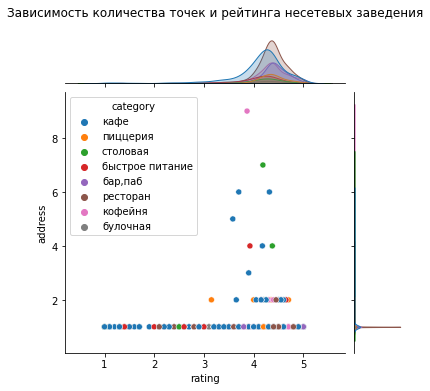

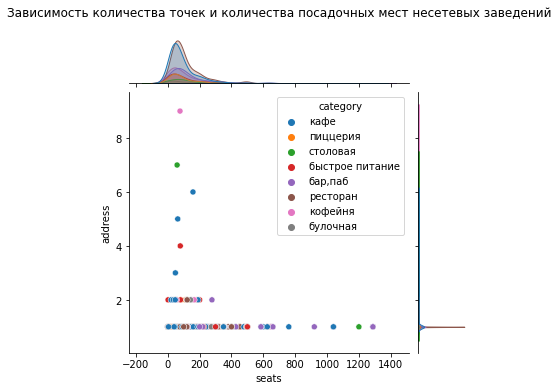

In [37]:
# посмотрим на зависимости для несетевых заведений
chain_no_data = not_strange_name_data.query('chain == "нет"')\
                                .groupby(['name', 'category'])\
                                .agg({'address': 'count', 'rating': 'mean', 'seats': 'mean'})\
                                .reset_index()

g1 = sns.jointplot(data=chain_no_data, x='rating', y='address', hue='category', height=5.5)
g1.fig.suptitle("Зависимость количества точек и рейтинга несетевых заведения")
g1.fig.subplots_adjust(top=.9)

g2 = sns.jointplot(data=chain_no_data, x='seats', y='address', hue='category', height=5.5)
g2.fig.suptitle("Зависимость количества точек и количества посадочных мест несетевых заведений")
g2.fig.subplots_adjust(top=.9);

Так как заказчика интересует открытие собственного заведения общественного питания, на графиках выше представлены зависимости рейтинга и количества посадочных мест для заведений, которые не являются сетевыми. Видно, что большая часть несетевых заведений включает одну или две точки, при этом для заведений с одной точкой рейтинг представлен на всем диапазоне от 1 до 5, но для заведений с большим числом точек средний рейтинг стремится к значениям 4 и выше. В свою очередь,  по количеству посадочных мест превалируют точки в диапазоне малых значений (до 200).

В столбце price представлены следующие группы (не учитывая NaN):
средние          1945
выше среднего     603
высокие           545
низкие            221


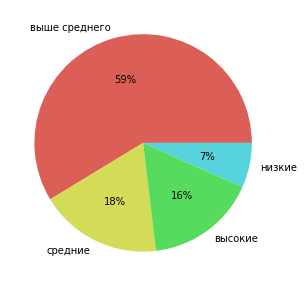

In [38]:
# посмотрим подробнее на распределение данных в столбце 'price'
pie_and_distribution(['price'], sns.color_palette('hls'))

Большая часть заведений (59%) в анализируемых данных относится к категории "выше среднего", заведений с "низкими" ценами всего 7%, в вот заведений со "средними" и "высокими" ценами практически поровну (18% и 16%, соответсвенно).

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Этот вывод был переписан: так как я больше не заполняю пропуски в 'price', то доли поменялись.
</div>

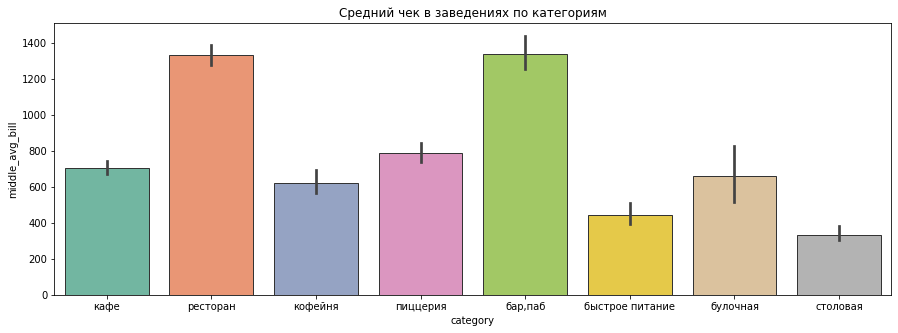

In [39]:
plt.figure(figsize=(15,5))
sns.barplot(x=data['category'], y=data['middle_avg_bill'], palette='Set2', edgecolor='.2')\
   .set_title("Средний чек в заведениях по категориям");

Исходя из графика видно, что больше всего денег люди оставляют в ресторанах, барах и пабах, а вот меньше платить склонны в заведениях быстрого питания и столовых (что явно определяется ценовой политикой и ассортиментом заведений).

,address
name,
шоколадница,120
домино'с пицца,77
додо пицца,74
one price coffee,72
яндекс лавка,72
cofix,65
prime,50
кофепорт,42
кулинарная лавка братьев караваевых,39


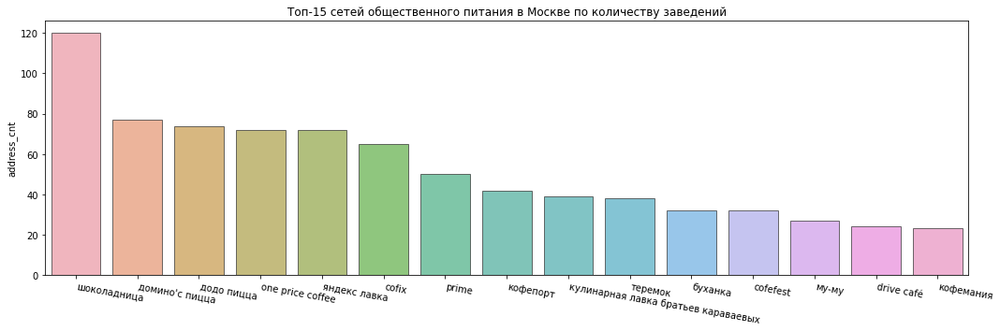

In [40]:
# найдем топ-15 популярных сетей в Москве (для отфильтрованных данных not_strange_name_data)
top_15_by_name = not_strange_name_data\
                            .groupby('name')\
                            .agg({'address':'count'})\
                            .sort_values(by='address',ascending=False).head(15)
display(top_15_by_name)

plt.figure(figsize=(15,5))
ax = sns.barplot(x=top_15_by_name.reset_index()['name'], y=top_15_by_name.reset_index()['address'], alpha=.7, edgecolor='.2')
ax.set_xticklabels(ax.get_xticklabels(), rotation=-10, ha="left")
plt.tight_layout()
plt.xlabel(None)
plt.ylabel("address_cnt")
plt.title("Топ-15 сетей общественного питания в Москве по количеству заведений");

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Вот смотри, тут сразу можно выделить самы большой и самый низкий показатель.
</div>

Самой крупной сетью в Москве является кофейня Шоколадница, согласно нашим данным она насчитывает 120 заведений общепита. Второе и третье место занимают пиццерии сетей Домино'с пицца (77 заведений) и Додо пицца (74 заведения). В целом, анализируя топ сетей общественного питания Москвы можно отметить, что большая часть из них представлена кофейнями.

In [41]:
# отобразим общее количество заведений и количество заведений каждой категории по районам
category_by_district_table1 = data.pivot_table(values='address', index='district', columns='category', aggfunc='count')
category_by_district_table1['sum'] = category_by_district_table1.apply(lambda x: x.sum(), axis=1)
display(category_by_district_table1)

category_by_district = data.groupby(['district','category'], as_index=False)['address'].agg('count')

fig = px.bar(category_by_district, 
             x='district', 
             y='address', 
             color='category',
             labels={
                     "address": "Количество заведений",
                     "district": "Округ",
                     "category": "Тип заведения"
                 },
             title='Категории объектов общественного питания в различных районах Москвы')
fig.update_xaxes(tickangle=10)
fig.show()

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,239,150,71,218,24,851
Северный административный округ,68,39,58,235,193,77,189,41,900
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,201,44,891


<div class="alert alert-danger">
<h1> Комментарий ревьюера ❌</h1>
    
Обрати внимание на подписи осей)</div>

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Нормально подписал оси.
</div>

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍 V2</h1>

👍
</div>

Абсолютным чемпионом, что и не удивительно, по общему количеству заведений общественного питания является Центральный административный округ, тут сосредоточено самое большое количество заведений каждой из категорий. В тоже время, наименьшее количество заведений обнаруживается в Северо-Западном административном округе. Юго-Западный и Юго-Восточный административные округа также не могут похвастаться большим количеством заведений общепита, при этом самыми распространенными категориями в этих районах являются кафе и рестораны. В целом, подобная тенденция свойственна всем округам, однако, стоит отметить, что Центральный административный округ выделяется среди прочих, в нем в большом объеме представлены различные кофейни (их количество практически схоже с количеством кафе на той же территории).

,rating
category,
"бар,паб",4.387712
булочная,4.268359
быстрое питание,4.050249
кафе,4.123886
кофейня,4.277282
пиццерия,4.301264
ресторан,4.290451
столовая,4.211429


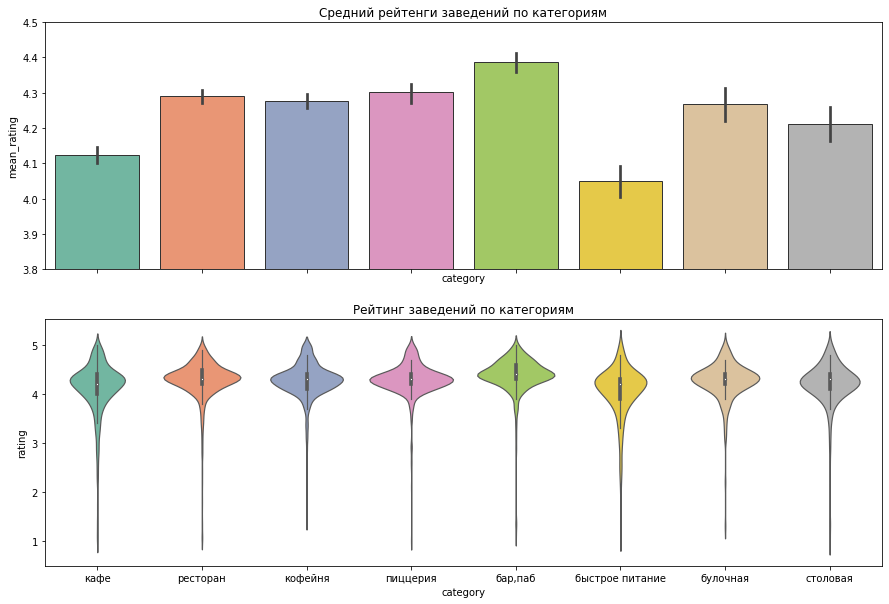

In [42]:
# посмотрим на распределение средних рейтингов по категориям заведений
rating_by_category = data.groupby('category').agg({'rating':'mean'})
display(rating_by_category)

f, axes = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

ax = sns.barplot(x=data['category'], y=data['rating'], palette='Set2', edgecolor='.2', ax=axes[0])
ax.set(ylabel="mean_rating", title="Средний рейтенги заведений по категориям")
ax.set(ylim=(3.8, 4.5))

sns.violinplot(x=data['category'], y=data['rating'], palette='Set2', linewidth=1.2, ax=axes[1])\
   .set_title("Рейтинг заведений по категориям");

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Очень подходящий вариант визуализации данных
</div>

Судя по представленным данным, усреднённые рейтинги в разных типах общепита практически не различаются. Самый низкий средний рейтинг у заведений категории быстрое питание, самый высокий - у баров и пабов.

In [43]:
# посчитаем средний рейтинг заведений по районам
rating_by_district = data.groupby('district').agg({'rating':'mean'})
rating_by_district

,rating
district,
Восточный административный округ,4.174185
Западный административный округ,4.181551
Северный административный округ,4.239778
Северо-Восточный административный округ,4.148260
Северо-Западный административный округ,4.208802
Центральный административный округ,4.377520
Юго-Восточный административный округ,4.101120
Юго-Западный административный округ,4.172920
Южный административный округ,4.184512


Для построения фоновой картограммы нам понадобятся границы районов Москвы:
- https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson

In [44]:
# читаем файл с гео-данными
with urllib.request.urlopen("https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson") as url:
    geo_json = geojson.load(url)

In [45]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создадим пустой кластер
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/stickers/512/map-pin.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker([row['lat'], row['lng']], popup=f"{row['name']} {row['rating']}", icon=icon).add_to(marker_cluster)

# применим функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# создадим хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(geo_data=geo_json,
           data=rating_by_district.reset_index(),
           columns=['district', 'rating'],
           key_on='feature.name',
           fill_color='OrRd',
           fill_opacity=0.7,
           legend_name='Средний рейтинг заведений по районам').add_to(m)

m

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Отличная карта получилась)
</div>

Самый высокий средний рейтинг отмичается в заведениях, расположенных в Центральном административном округе, самые низкий - в Юго-Восточном административном округе.

,name
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,76
Варшавское шоссе,75
Ленинградское шоссе,69


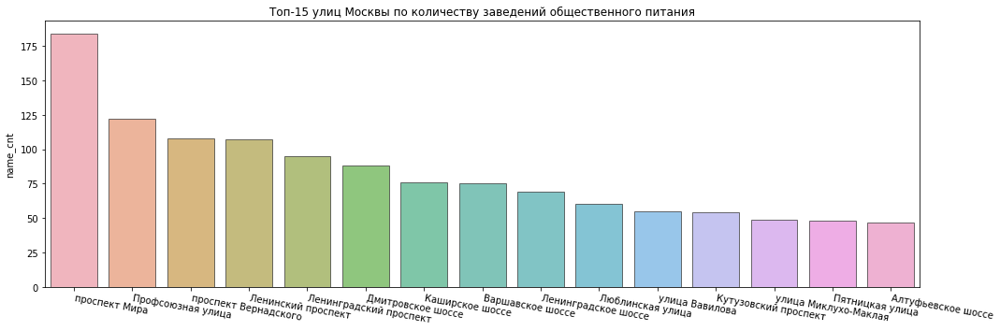

In [46]:
top_15_by_street = data.groupby('street').agg({'name':'count'}).sort_values(by='name',ascending=False).head(15)
display(top_15_by_street)

plt.figure(figsize=(15,5))
ax = sns.barplot(x=top_15_by_street.reset_index()['street'], y=top_15_by_street.reset_index()['name'], alpha=.7, edgecolor='.2')
ax.set_xticklabels(ax.get_xticklabels(), rotation=-10, ha="left")
plt.tight_layout()
plt.xlabel(None)
plt.ylabel("name_cnt")
plt.title("Топ-15 улиц Москвы по количеству заведений общественного питания");

Возглавляет топ проспект Мира (184 заведения), следом идет Профсоюзная улица (122 заведения). Также в топе присутствуют Ленинский проспект и Ленинградское шоссе - одни из самых длинных улиц Москвы. Общий разброс между первым и последним местом в топе по количеству открытых точек составляет 137 заведений.

In [47]:
# найдем улицы, на которых находится только один объект общепита 
low_street_list = data.groupby('street').agg({'name':'count'}).query('name == 1').index.tolist()
low_street_list

['1-й Автозаводский проезд',
 '1-й Балтийский переулок',
 '1-й Варшавский проезд',
 '1-й Вешняковский проезд',
 '1-й Голутвинский переулок',
 '1-й Грайвороновский проезд',
 '1-й Дербеневский переулок',
 '1-й Земельный переулок',
 '1-й Капотнинский проезд',
 '1-й Кирпичный переулок',
 '1-й Колобовский переулок',
 '1-й Котляковский переулок',
 '1-й Курьяновский проезд',
 '1-й Николощеповский переулок',
 '1-й Новокузнецкий переулок',
 '1-й Рижский переулок',
 '1-й Самотёчный переулок',
 '1-й Сетуньский проезд',
 '1-й Спасоналивковский переулок',
 '1-й Щипковский переулок',
 '1-я Боевская улица',
 '1-я Курьяновская улица',
 '1-я Парковая улица',
 '1-я Стекольная улица',
 '1-я Фрунзенская улица',
 '1-я Ямская улица',
 '1-я линия Хорошёвского Серебряного Бора',
 '11-я Парковая улица',
 '12-я Парковая улица',
 '14-я Парковая улица',
 '16-я Парковая улица',
 '17-й проезд Марьиной Рощи',
 '2-й Балтийский переулок',
 '2-й Боткинский проезд',
 '2-й Верхний Михайловский проезд',
 '2-й Вышеславцев 

In [48]:
# посмотрим на заведения на этих улицах
low_street = data.query('street in @low_street_list').reset_index(drop=True)
low_street.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,нет,NaN,МКАД 80-й километр,False
1,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,нет,180.0,улица Бусиновская Горка,False
2,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,нет,NaN,Прибрежный проезд,False
3,mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,нет,NaN,МКАД 78-й километр,False
4,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,да,NaN,Угличская улица,False


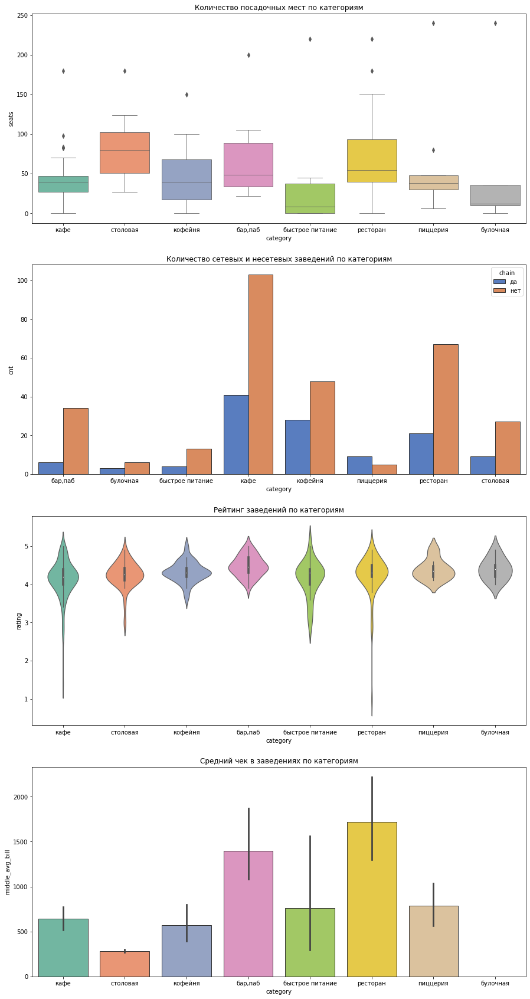

In [49]:
# посмотреим на некоторые характеристики для выделенных в low_street заведений 
low_street_chain = low_street.groupby(['category', 'chain'])['chain']\
                         .count()\
                         .to_frame()\
                         .rename(columns={'chain':'cnt'})\
                         .reset_index()

f, axes = plt.subplots(4, 1, figsize=(15, 30))

sns.boxplot(x=low_street['category'], y=low_street['seats'], palette='Set2', linewidth=.8, ax=axes[0])\
   .set_title("Количество посадочных мест по категориям")

sns.barplot(x=low_street_chain['category'],
            y=low_street_chain['cnt'],
            hue=low_street_chain['chain'],
            palette='muted', edgecolor='.2', ax=axes[1])\
    .set_title("Количество сетевых и несетевых заведений по категориям")

sns.violinplot(x=low_street['category'], y=low_street['rating'], palette='Set2', linewidth=1.2, ax=axes[2])\
   .set_title("Рейтинг заведений по категориям")

sns.barplot(x=low_street['category'], y=low_street['middle_avg_bill'], palette='Set2', edgecolor='.2', ax=axes[3])\
   .set_title("Средний чек в заведениях по категориям");

Для заведений, единственных на своей улице, сохраняется общий тренд, свойственный большей части заведений общепита Москвы. Общее количество посадочных мест не превышает 200 и в основном сосредоточено в районе 25-75 на заведение. Основные категории заведений в разбивке сетевые/несетевые также воспроизводят тренд, характерный для Москвы в целом, однако отличия наблюдаются в категорих булочные и кофейни. Для указанных категорий несетевые точки превалируют над сетевыми. Средние рейтинги заведений по категориям не сильно различаются и соответсвуют рейтенгам в целом по Москве.
<br>Отдельно стоит рассмотреть средние чеки по категориям, так, если учесть погрешности и отсутствие категории "булочные", можно заключить, что средний чек не сильно отличается от данных  в целом по Москве.

In [50]:
# посмотрим, как распределяются ценовые сегменты среди заведений в low_street
fig = px.pie(values=low_street['price'].value_counts(),
             names=low_street[low_street['price'].isnull() == False]['price'].unique(),
             title='Распределение по ценовым сегментам заведений, единсвенных на своей улице')
fig.show()

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Всегда приятно пользоваться интерактивными визуализациями)
</div>

Примечательно, что для заведений, единственных на своей улице, характерно относительное уменьшение цен на заказы (в градациях  параметра 'price'). В то время как в целом по Москве более половины заведений относятся к категории цен "выше среднего", ~62% проанализированных заведений относятся к категории со "средними" ценами. В тоже самое время, в целом для всех заведений Москвы порядка 7% имеют "низкие" цены, а вот среди отобранных для данного анализа заведений такие цены отмечаются у 14%.

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Этот вывод тоже был слегка переписан.
</div>

In [51]:
# посчитаем медиану среднего чека в заведениях по районам
bill_by_district = data.groupby('district').agg({'middle_avg_bill':'median'})
bill_by_district

,middle_avg_bill
district,
Восточный административный округ,575.0
Западный административный округ,1000.0
Северный административный округ,650.0
Северо-Восточный административный округ,500.0
Северо-Западный административный округ,700.0
Центральный административный округ,1000.0
Юго-Восточный административный округ,450.0
Юго-Западный административный округ,600.0
Южный административный округ,500.0


In [52]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(geo_data=geo_json,
           data=bill_by_district.reset_index(),
           columns=['district', 'middle_avg_bill'],
           key_on='feature.name',
           fill_color='OrRd',
           fill_opacity=0.7,
           legend_name='Медиана среднего чека заведений по районам').add_to(m2)

m2

Районами с самыми высокими значениямми медианы среднего чека являются Центральный и Западный административный округа (1000 руб.). Самая маленькая медиана среднего чека отмечена в Юго-Восточном административном округе и составляет 450 руб.	

<div style="border-radius: 15px; background:BlanchedAlmond; padding: 20px">

📜 Итог после анализа данных:
- заведения общепита Москвы неоднородны по своей структуре, ключевыми факторами, которые оказывают влияние на прочие параметры, стоит выделить категорию заведения и географическое положение
- основываясь на проведенном анализе можно заключить, что в наибольшем объеме в Москве представлены заведения категорий кафе, ресторан и кофейня
- кафе и рестораны чаще представлены заведениями, не входящими в состав какой-нибудь сети, а для кофеен соотношение сетевых и несетевых точек составляет 51% к 49%
- подавляющее большинство заведений из топа по количеству открытых точек принадлежит к категории кофейни 
- большая часть заведений общепита Москвы (55%) относится к ценовой группе "выше среднего", при этом наибольший средний чек характерен для ресторанов, пабов и баров, а наименьший - для столовых и заведений быстрого питания
- несмотря на все сказанное выше, средние рейтинги для всех типов заведений практически не отличаются и находятся в районе 4-4.4
- с точки зрения географического положения, наиболее прибыльные заведения (согласно медиане среднего чека) располагаются в  Центральном и Западном административных округах, наименее прибыльные - в Юго-Восточном административном округе
- крупные длинные улицы Москвы, такие как проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект и другие агрегируют наибольшее количество заведений общественного питания

</div>

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

В целом все классно, главное не забудь отсортировать все визуализации)
</div>

## Часть 3. Детализация исследования: открытие кофейни

<div style="border: 1px solid; padding: 20px">
<i>Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.</i>

</div>

In [53]:
# отберем только кофейни
coffe = data.query('category == "кофейня"').reset_index(drop=True)
display(coffe.head())

print('Всего в таблице представлено {} кофеен.'.format(coffe.shape[0]))
print('Из них {} заведений относятся к сетевым.'.format(coffe[coffe['chain'] == "да"]['name'].count()))
print('В таблице представлено {} уникальных наименования кофеен.'.format(coffe['name'].nunique()))
print('{} кофеен работают круглосуточно.'.format(coffe[coffe['is_24/7'] == True]['name'].count()))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,нет,NaN,улица Маршала Федоренко,False
1,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,да,NaN,NaN,False
2,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,да,46.0,Коровинское шоссе,False
3,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,да,NaN,улица Маршала Федоренко,False
4,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,да,NaN,улица Дыбенко,False


Всего в таблице представлено 1413 кофеен.
Из них 720 заведений относятся к сетевым.
В таблице представлено 825 уникальных наименования кофеен.
59 кофеен работают круглосуточно.


rating                      
                                           max  min      mean median
district                                                            
Восточный административный округ           5.0  3.0  4.282857    4.3
Западный административный округ            5.0  2.3  4.195333    4.2
Северный административный округ            5.0  2.0  4.291710    4.3
Северо-Восточный административный округ    5.0  1.4  4.216981    4.3
Северо-Западный административный округ     5.0  2.0  4.325806    4.3
Центральный административный округ         5.0  2.3  4.336449    4.3
Юго-Восточный административный округ       5.0  2.3  4.225843    4.3
Юго-Западный административный округ        5.0  3.3  4.283333    4.3
Южный административный округ               5.0  2.0  4.232824    4.3

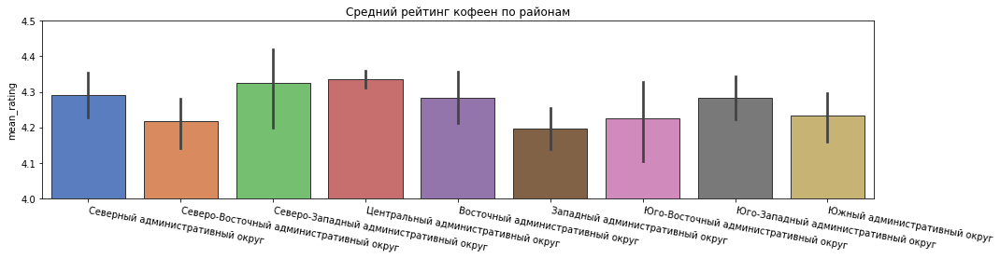

In [54]:
# посчитаем параметры рейтинга кофеен по районам
coffe_by_district = coffe.groupby('district').agg({'rating':['max', 'min', 'mean', 'median']})
display(coffe_by_district)

plt.figure(figsize=(15,4))
ax = sns.barplot(x=coffe['district'],
                 y=coffe['rating'],
                 palette='muted', edgecolor='.2')
ax.set(ylim=(4, 4.5))
ax.set_xticklabels(ax.get_xticklabels(), rotation=-10, ha="left")
plt.tight_layout()
plt.xlabel(None)
plt.ylabel("mean_rating")
plt.title("Средний рейтинг кофеен по районам");

Как и в целом для заведений общепита Москвы, для кофеен характерно незначительное колебание среднего рейтинга в зависимости от административного округа. Подтверждая ранее полученные данные, кофейни Центрального административного округа имеют наивысший средний рейтинг среди заведений из прочих округов Москвы.

In [55]:
print('Средняя стоимость чашки капучино для Москвы: {} руб.'.format(round(coffe['middle_coffee_cup'].mean(), 0)))
print('Медиана стоимости чашки капучино для Москвы: {} руб.'.format(round(coffe['middle_coffee_cup'].median(), 0)))

coffe_by_bill = coffe.groupby('district').agg({'middle_coffee_cup':['max', 'min', 'mean', 'median']})
display(coffe_by_bill)

Средняя стоимость чашки капучино для Москвы: 173.0 руб.
Медиана стоимости чашки капучино для Москвы: 170.0 руб.


middle_coffee_cup                    \
                                                      max   min        mean   
district                                                                      
Восточный административный округ                    260.0  60.0  142.880952   
Западный административный округ                     300.0  60.0  189.938776   
Северный административный округ                     325.0  60.0  165.789474   
Северо-Восточный административный округ             297.0  60.0  165.333333   
Северо-Западный административный округ              270.0  60.0  165.523810   
Центральный административный округ                  328.0  60.0  187.518519   
Юго-Восточный административный округ                375.0  60.0  151.088235   
Юго-Западный административный округ                 291.0  95.0  184.176471   
Южный административный округ                        275.0  60.0  158.488372   

                                                
                                        median  
district                                        
Восточный административный округ         135.0  
Западный административный округ          189.0  
Северный административный округ          159.0  
Северо-Восточный административный округ  162.5  
Северо-Западный административный округ   165.0  
Центральный административный округ       190.0  
Юго-Восточный административный округ     147.5  
Юго-Западный административный округ      198.0  
Южный административный округ             150.0

Средняя стоимость чашки капучино для Москвы составляет 173 руб. Однако, стоит учитвать, что в зависимости от района средняя цена варьирует. В районах, которые по результатам анализа характеризуются меньшими рейтингами и средними чеками, стоимость чашки капучино ниже на 5-20%. В Западном, Центральном и Юго-Западном административных округа цена наоборот примерно на 10% выше.

<div style="border-radius: 15px; background:BlanchedAlmond; padding: 20px">

📜 Рекомендация:
<br>Исходя из проведенного анализа можно предположить, что наиболее перспективный вариант - открытие кофейни в Западном административном округе на одной из крупных оживленных улиц. Высокое медианное значение цены чашки кофе в этом районе (189 руб.) в сочетании с не самыми высокими средними рейтингами (4.2) позволяют сделать ставку на хороший сервис и качество обслуживания, которые могут сыграть ключевую роль на пути построения успешного бизнеса. Очевидно, что ограничивающим фактором в таком случае станет стоимость аренды, однако, выбор именно этого района позволит установить одну из наибольших цен на заказы, обеспечит хороший поток клиентов и стабильную выручку. При условии правильной маркетенговой политики, верного ценообразования и успешной рекламной компании существует высокая вероятность выделиться на фоне конкурентов, особенно сетевых заведений, и привлечь новых заинтересованных клиентов. 
<br>В качестве примера потенциально успешного месторасположения стоит рассмотреть район Раменки - территорию около парка имени 50-летия Октября между Мичуринским проспектом и проспектом Вернадского. На карте ниже отображен соответствующий участок и указаны ближайшие кофейни, присутствующие в датасете.

</div>

In [56]:
# cof_lat - широта центра выбранного участка, cof_lng - долгота 
cof_lat, cof_lng = 55.683458, 37.502390


cof_map = Map(location=[cof_lat, cof_lng], zoom_start=14.25)
marker_cluster = MarkerCluster().add_to(cof_map)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/stickers/512/map-pin.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker([row['lat'], row['lng']], popup=f"{row['name']} {row['rating']}", icon=icon).add_to(marker_cluster)

coffe.apply(create_clusters, axis=1)

cof_map

<div class="alert alert-success">
<h1> Комментарий ревьюера 👍</h1>

Тут все на высшем уровне! С выводами полностью согласен)
</div>

## Часть 4. Подготовка презентации

Презентация: https://1drv.ms/b/s!AoHDVEoGgTLth3bPjknKgX1-xTIw?e=u0wa52

<div class="alert alert-warning">
<h1> Комментарий ревьюера 💡</h1>
    
В целом презентации все классно. Дам несколько рекомендаций:

    -  Использовуй меньше текстовой информации. Кратко описывай, что следует из представленной визуализации. Старайся ограничится одним предложением;
    -  Сортируй данные в визуализации, чтобы аудитории не нужно было долго всматриваться в визуализацию;
    -  Старайся использово как можно больше разных визуализаций, чтобы каждый слайд запоминался.
</div>

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Хорошо, я тогда не стану переделывать презентацию, но учту рекомендации в дальнейшем. 
</div>

<div class="alert alert-warning">
<h1> Общий комментарий о работе</h1>
    
Отличная работа! Ты молодец) Видно, что неплохо разобрался с темами спринтов. Есть немного замечаний, но уверен, что они не вызовут у тебя сложностей. После доработки обязательно проверь комментарии и выводы. Возможно их нужно будет скорректировать.
    
Жду доработанную версию проекта)
</div>

<div class="alert alert-info"> 
    <b>🦄 Комментарий студента:</b> 
    Николай, спасибо за ревью! Я постарался учесть все замечания и исправить недочеты.
</div>

<div class="alert alert-success">
<h1> Общий комментарий о работе V2</h1>
    
Критических замечаний больше нет, значит проект можно принимать) Спасибо большое за проделанную работу, у тебя получился отличный проект!

Желаю тебе успехов в двльнейшем обучении)
</div>